<a href="https://colab.research.google.com/github/john-cant/AMLS2_24_25_SNJCCAN57/blob/main/Task_Single_Base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# AMLS2 Assignment
## Task A: SRRESNET BASE

Explore Run Single Model

## Import libraries
The required libraries for this notebook are sklearn, copy, numpy and matplotlib.

In [ ]:
## first enable autoreload during development so latest (new) version local code library is reloaded on execution
## can be commented out when local code development not happening to avoid overhead
%load_ext autoreload
%autoreload 2

import sys
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

## import libraries
import io
import glob
import os
import numpy as np
import matplotlib.pyplot as plt

try:
    from google.colab import drive
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    # Code that uses google.colab functionalities
    if not os.path.exists('/content/drive/My Drive'):   ## check if Google drive mounted
        from google.colab import drive
        drive.mount('/content/drive')
    else:
        print("Google Drive is already mounted.")
    print("Running in Google Colab")
    current_directory = '/content/drive/My Drive/AMLS2'
    gpu_info = !nvidia-smi
    gpu_info = '\n'.join(gpu_info)
    if gpu_info.find('failed') >= 0:
      print('Not connected to a GPU')
    else:
      print(gpu_info)
else:
    # Alternative code for non-Colab environments
    print("Not running in Google Colab")
    current_directory = os.getcwd()
    # Add your alternative code here that doesn't rely on google.colab

sys.path.append(current_directory)       ## load project directory
print(os.listdir(current_directory))  ## check by listing files
## load additional functions I have developed to support AMLS assignments
import AMLS_common as ac

## import tensorflow
import tensorflow as tf
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))
### from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Multiply, Add, Layer, Lambda, LeakyReLU
from tensorflow.keras.layers import Input, Conv2D, Flatten, UpSampling2D, Dropout, BatchNormalization, PReLU
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.losses import BinaryCrossentropy, Hinge, MeanAbsoluteError
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.initializers import Constant
from tensorflow.keras.applications.vgg19 import VGG19
import tensorflow.keras.backend as K
from tensorflow.nn import depth_to_space

from skimage.metrics import structural_similarity as ssim


Your runtime has 89.6 gigabytes of available RAM

You are using a high-RAM runtime!
Mounted at /content/drive
Running in Google Colab
Thu Apr  3 15:58:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             44W /  400W |       0MiB /  40960MiB |      0%      Default |
|     

## Set base parameters
Including hyperparameters and environment specifics

In [ ]:
test_run       = 'N'                         ## set yes when running test output
## Loading the data file using a loader
UPSCALE_FACTOR = 2           ## Factor between LR and HR
IMG_SIZE       = 224
CROP_SIZE      = 224         ## HR crop size
## now set up the required hyperparameter sets
folderbase     = current_directory            ## project folder
## Initialize hyperparameters from spreadsheet
filename       = current_directory+"/hyperparam_base_1.xlsx"
if os.path.isfile(filename):
    item = ac.HyperParameters.load_excel(filename)
else:
    print(filename+" does not exist. Loading default hyperparameters instead")
    item      = ac.HyperParameters(learning_rate=0.01,
                                   kernel_size=3,
                                   num_epochs=75,
                                   num_filter=128,
                                   layers=4,
                                   dropout_rate=0.25,
                                   optimise="Adam",
                                   strides=2,
                                   padding="same",
                                   loss="Adam")
## print out hyperparameters
print(ac.HyperParameters.list_parameters(item))
## set up progress tracking call back
tqdm_callback = ac.TqdmEpochProgress(total_epochs=item.num_epochs)

learning_rate: 0.001
batch_size: 2
num_epochs: 2
optimise: Adam
loss: ssim_loss
num_filter: 128
strides: 1
padding: same
dropout_rate: 0.25
layers: 64
activation: prelu
kernel_size: 3
scale: 4
momentum: 0.9
epsilon: 1e-05



In [ ]:
## set up lists and parameters
test_list       = []
run_list        = []
patience        = 3                                      ## number of overfitting epochs before terminating
threshold       = 0.1                                    ## overfitting threshold
## control and environment (e.g. verbose) parameters
filebase        = current_directory+"/metrics/"          ## the folder to store the metrics and summary files generated for each run
verbose         = 0                                      ## if value equals 1 then print additional process information in steps below
## Define training folder paths
lr_train_folder = current_directory+"/dataset/track1/train/LR/DIV2K_train_LR_bicubic_X2"
hr_train_folder = current_directory+"/dataset/track1/train/HR/DIV2K_train_HR"
## Define validation folder paths
lr_val_folder = current_directory+"/dataset/track1/val/LR/DIV2K_valid_LR_bicubic_X2"
hr_val_folder = current_directory+"/dataset/track1/val/HR/DIV2K_valid_HR"


#Run the load, model, train and test cycle for each set of hyperparameters

SRRESNET_BASE with HyperParameters(learning_rate=0.001, batch_size=2, num_epochs=2, optimise='Adam', loss='ssim_loss', num_filter=128, strides=1, padding='same', dropout_rate=0.25, layers=64, activation='prelu', kernel_size=3, scale=4, momentum=0.9, epsilon=1e-05)

Summary metrics for train_dataset
type: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
length: 400
shape: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 896, 896, 3), dtype=tf.float32, name=None))>


Epoch Progress:   0%|          | 0/2 [00:00<?, ?epoch/s]

Epoch 1/2
400/400 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - acc: 0.3952 - loss: 0.4707

Epoch Progress:  50%|█████     | 1/2 [09:36<09:36, 576.33s/epoch, acc=0.462, loss=0.407, val_acc=0.584, val_loss=0.373]

400/400 ━━━━━━━━━━━━━━━━━━━━ 576s 446ms/step - acc: 0.3954 - loss: 0.4705 - val_acc: 0.5842 - val_loss: 0.3726
Epoch 2/2
400/400 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step - acc: 0.6402 - loss: 0.3384

Epoch Progress: 100%|██████████| 2/2 [12:03<00:00, 323.70s/epoch, acc=0.635, loss=0.335, val_acc=0.621, val_loss=0.318]

400/400 ━━━━━━━━━━━━━━━━━━━━ 147s 359ms/step - acc: 0.6402 - loss: 0.3384 - val_acc: 0.6210 - val_loss: 0.3177


Epoch Progress: 100%|██████████| 2/2 [12:03<00:00, 361.60s/epoch, acc=0.635, loss=0.335, val_acc=0.621, val_loss=0.318]


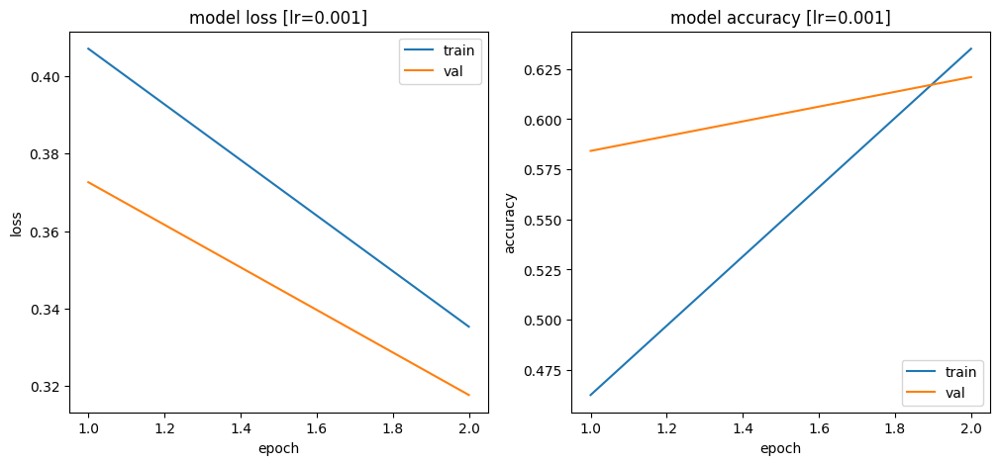

metrics_df ['acc', 'loss', 'val_acc', 'val_loss'] ['epoch', 'acc', 'loss', 'val_acc', 'val_loss']
Files saved: /content/drive/My Drive/AMLS2/metrics/metrics_2025_04_03_at_161126.xlsx /content/drive/My Drive/AMLS2/metrics/summary_2025_04_03_at_161126.txt
1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
low & pred


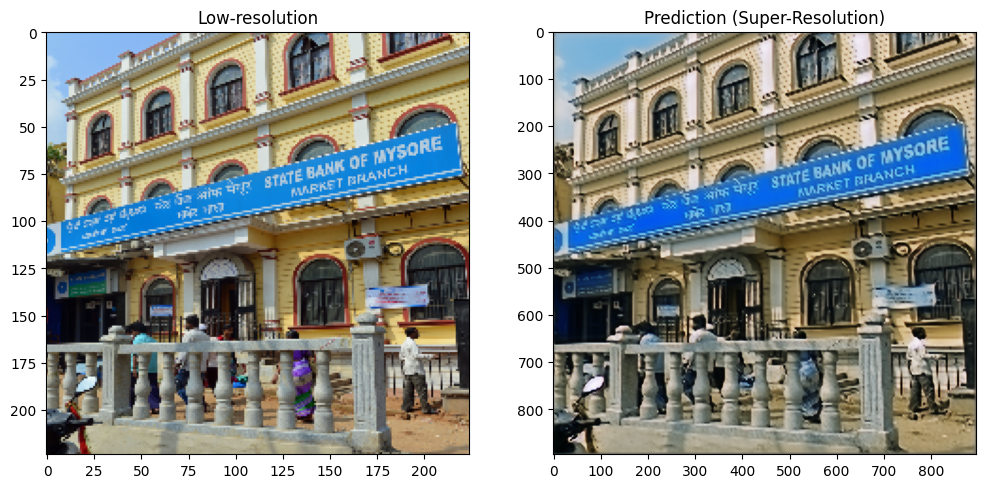

high & pred


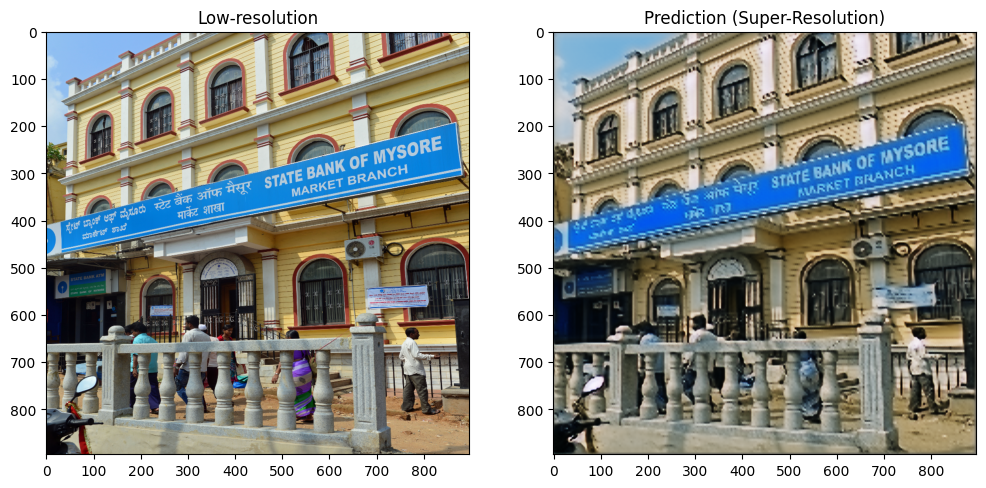

psnr 67.09910352355139
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.5992597
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
low & pred


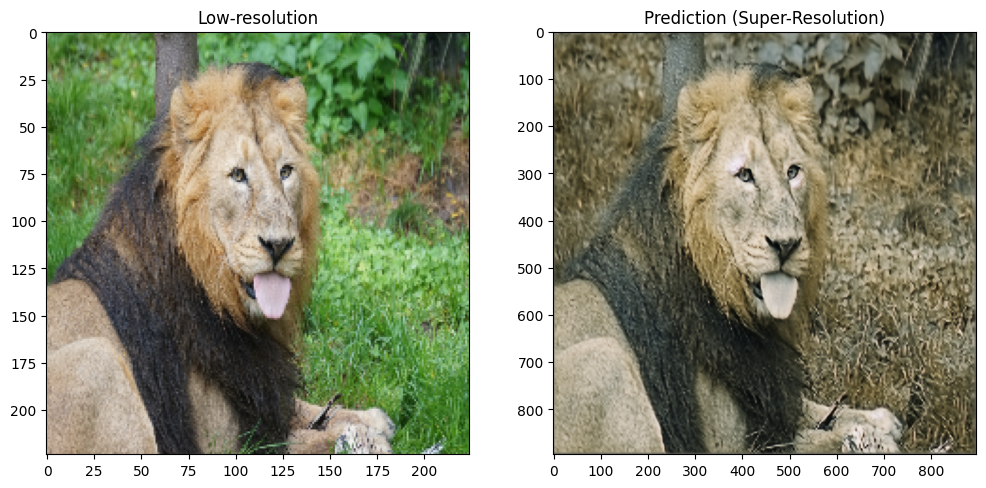

high & pred


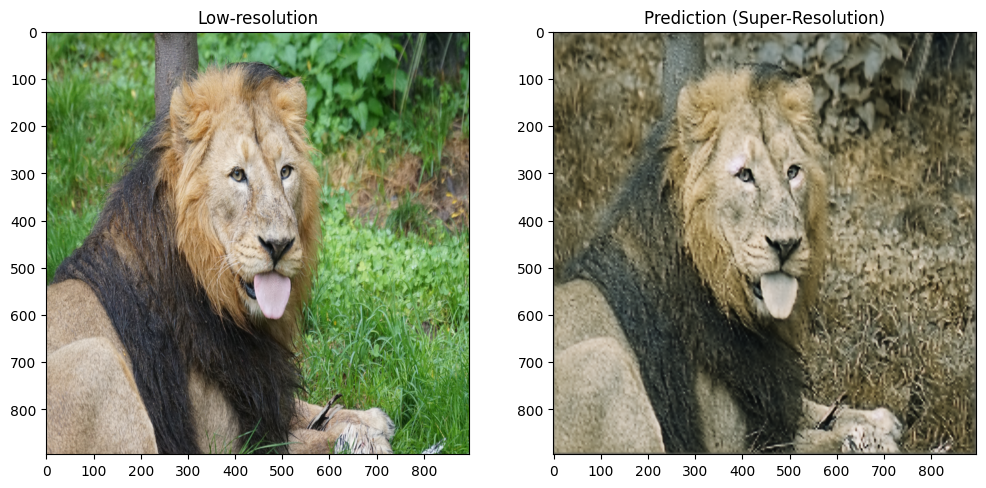

psnr 69.82817993072332
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.69288903
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
low & pred


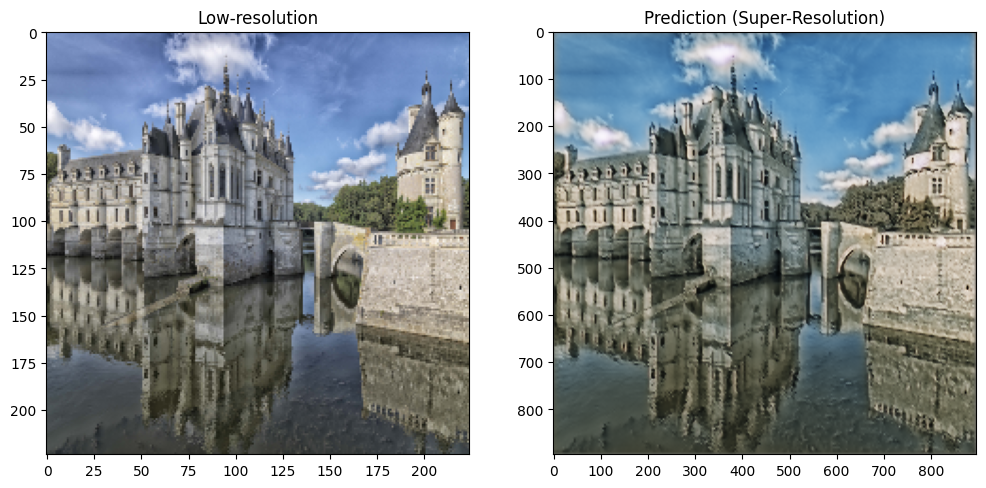

high & pred


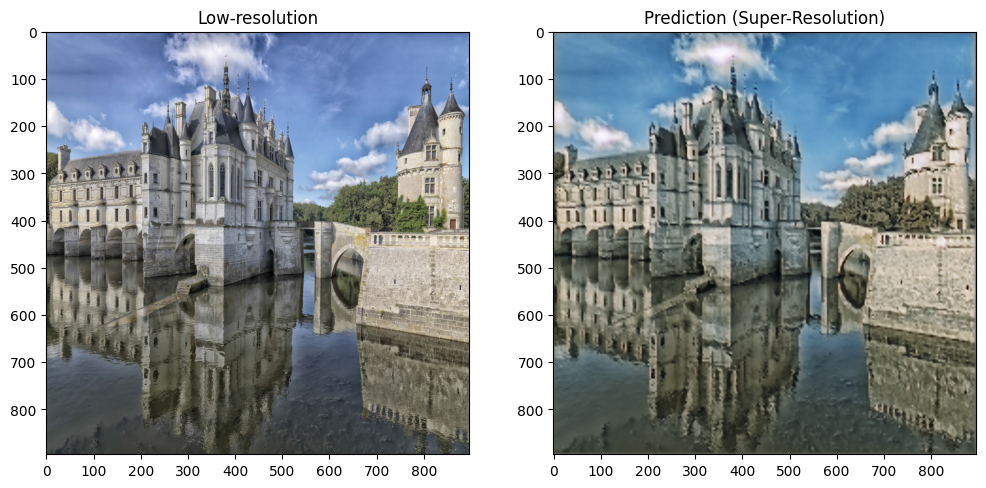

psnr 70.86662998880985
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.7024681
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
low & pred


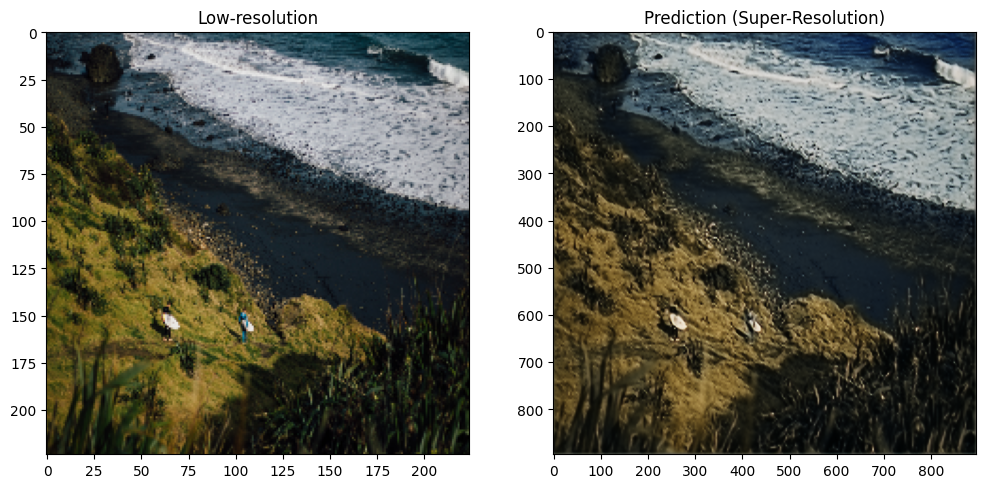

high & pred


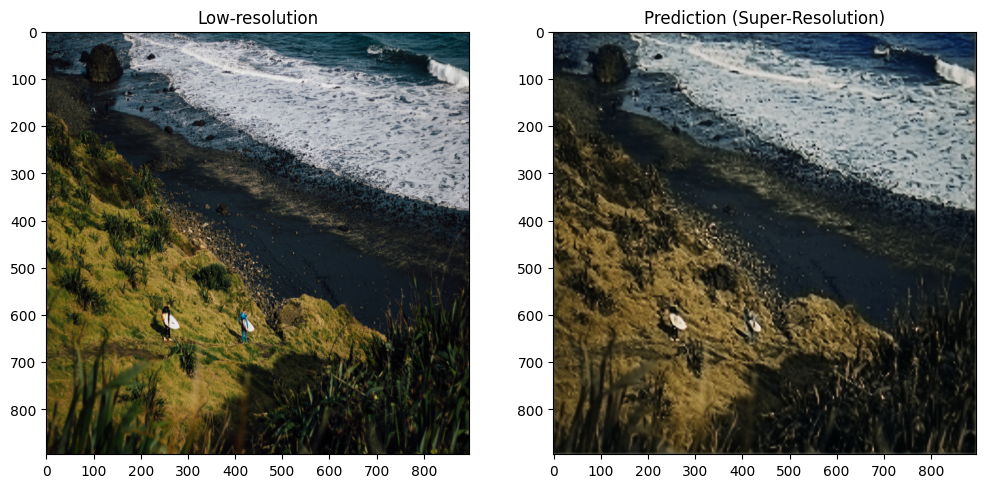

psnr 72.08035567982623
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.683634
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
low & pred


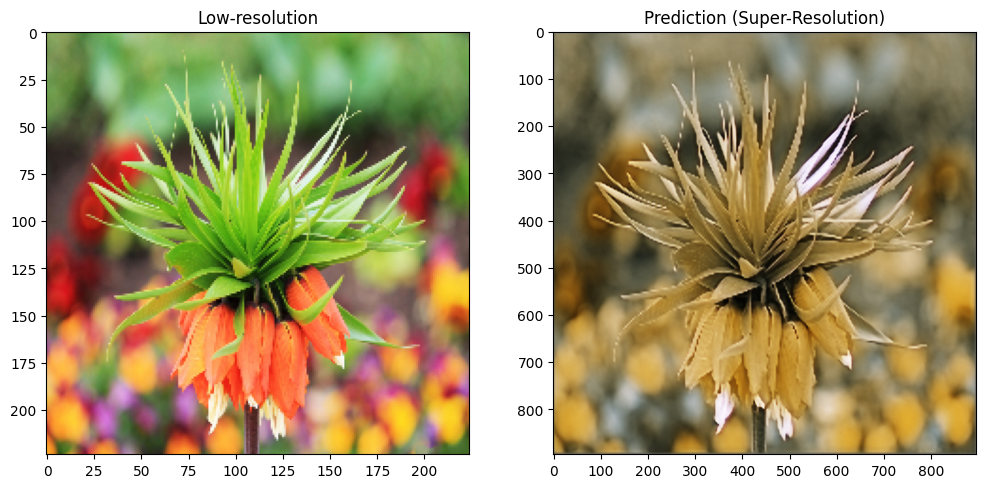

high & pred


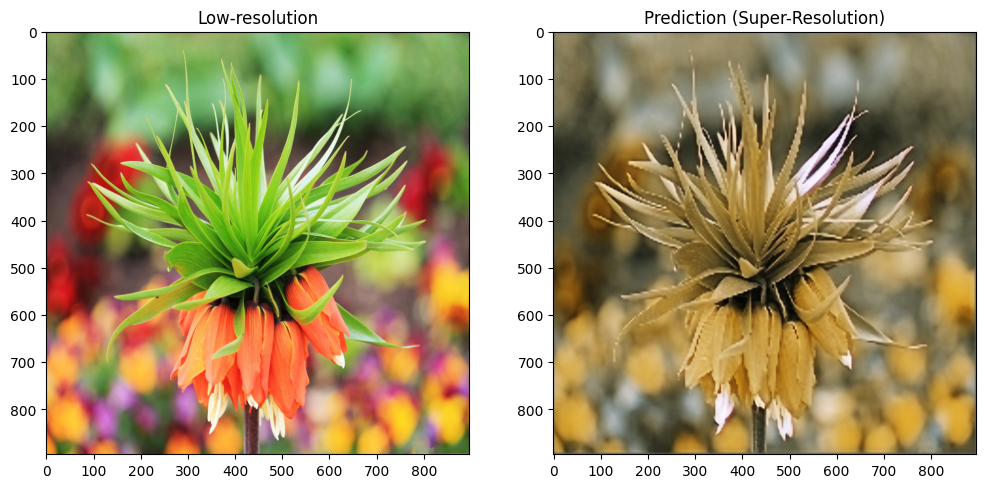

psnr 66.90863293883916
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.8124378
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
low & pred


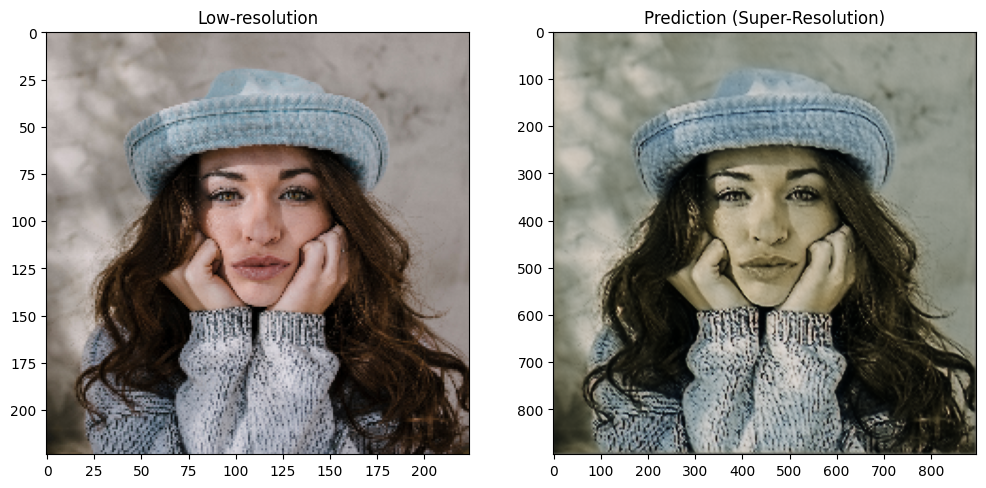

high & pred


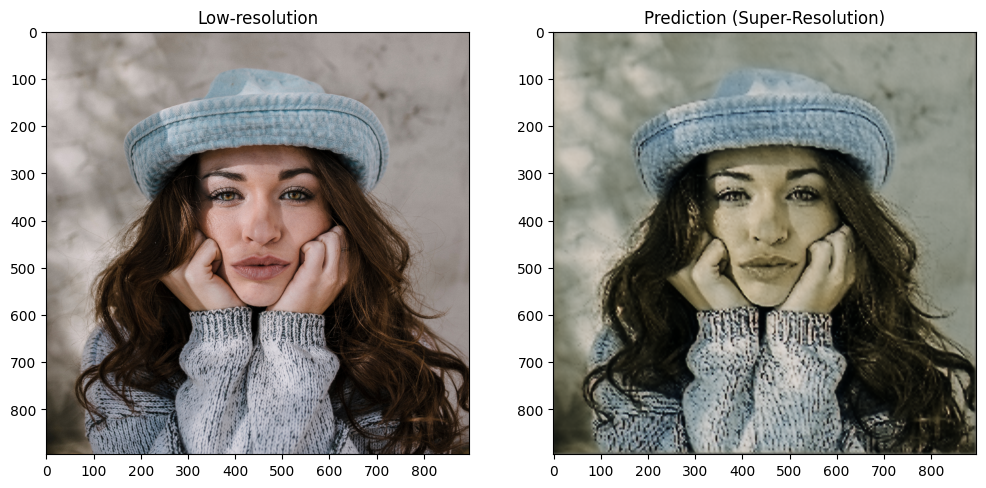

psnr 70.8228923074835
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.69705296
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
low & pred


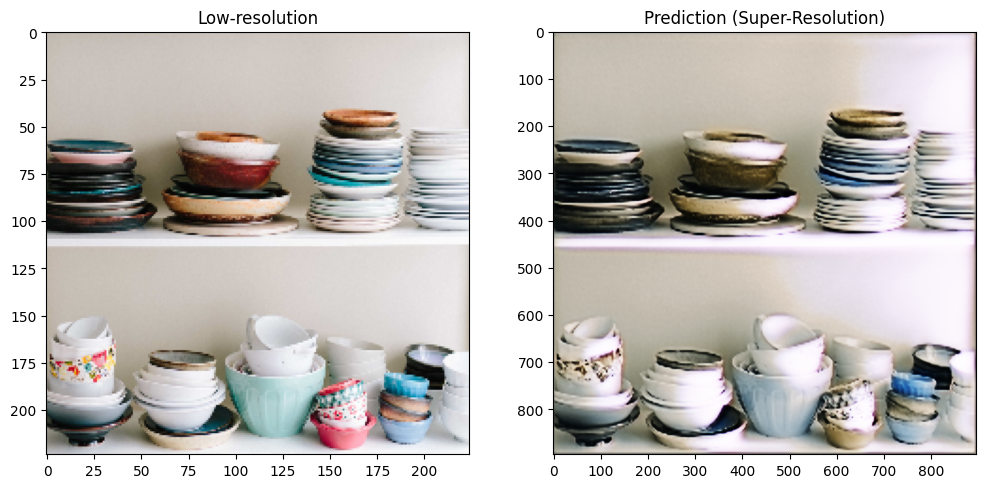

high & pred


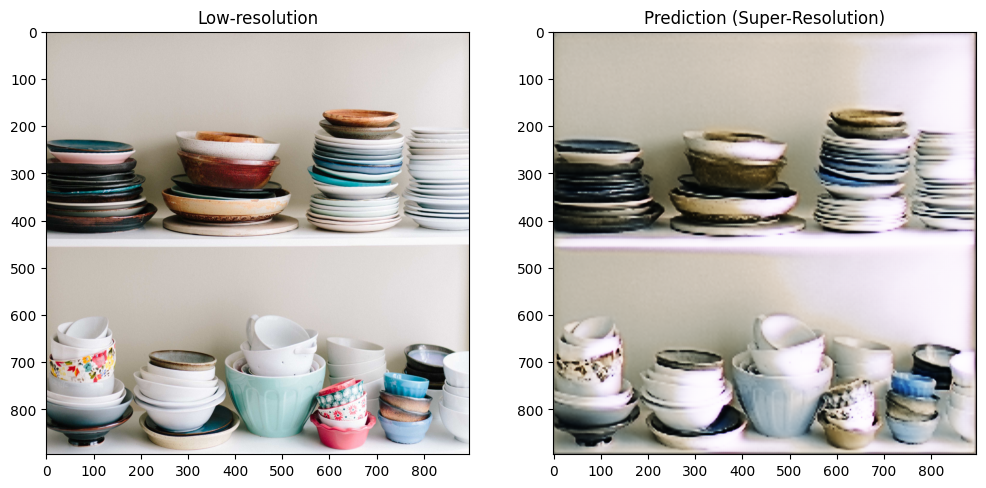

psnr 69.75811473310966
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.80632585
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
low & pred


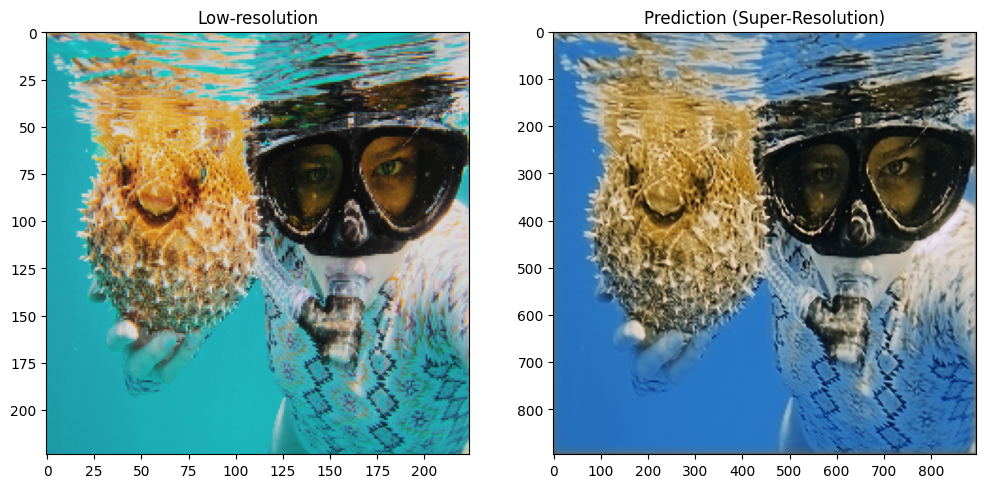

high & pred


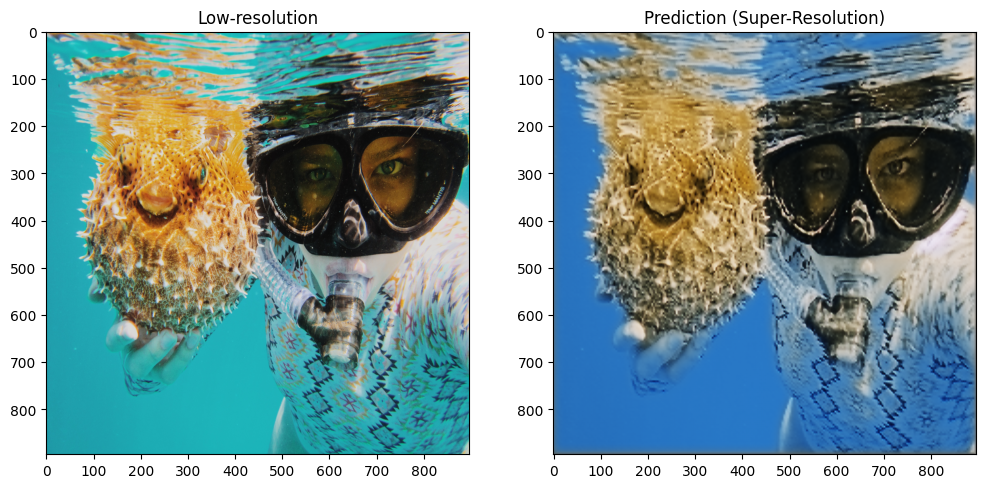

psnr 67.57260915428894
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.680321
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
low & pred


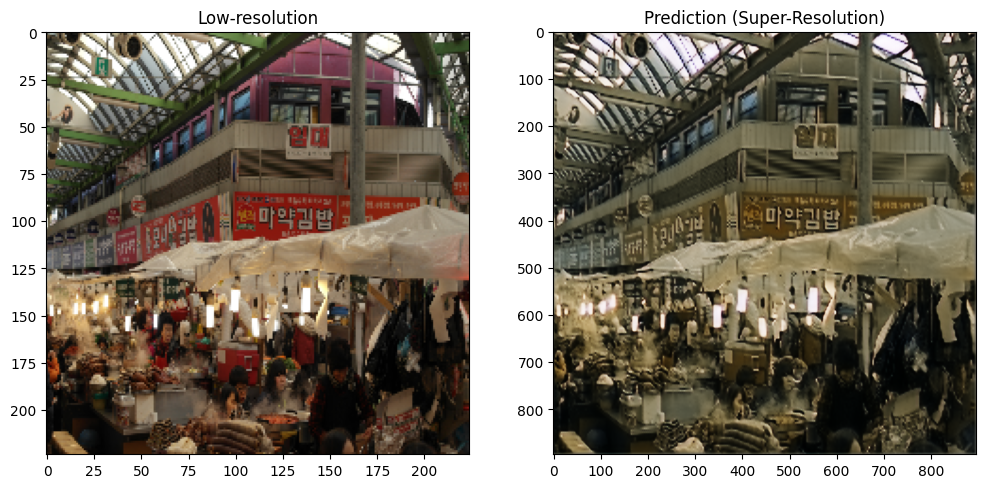

high & pred


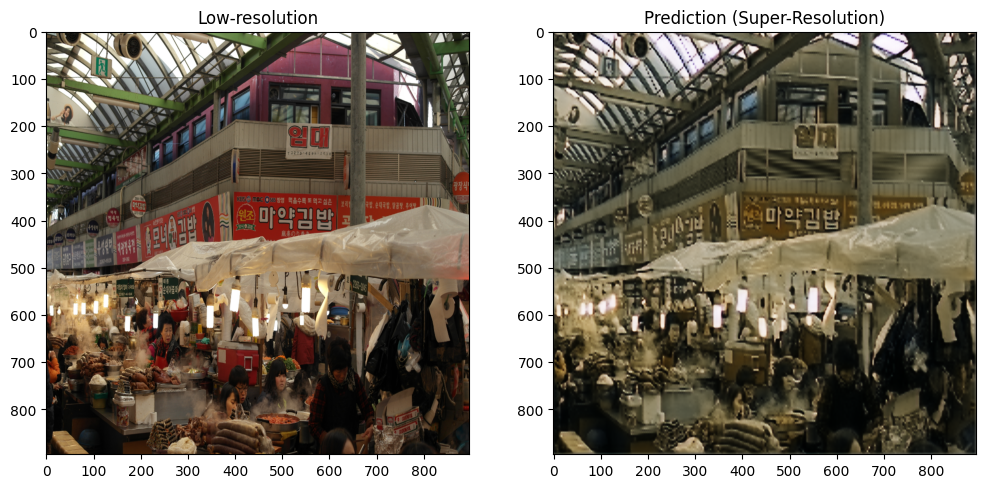

psnr 69.90310640593172
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.70393735
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
low & pred


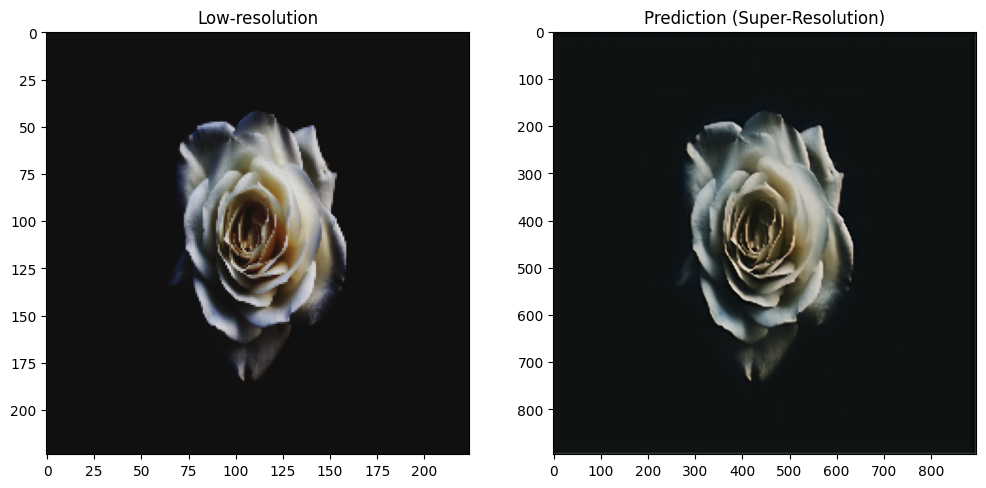

high & pred


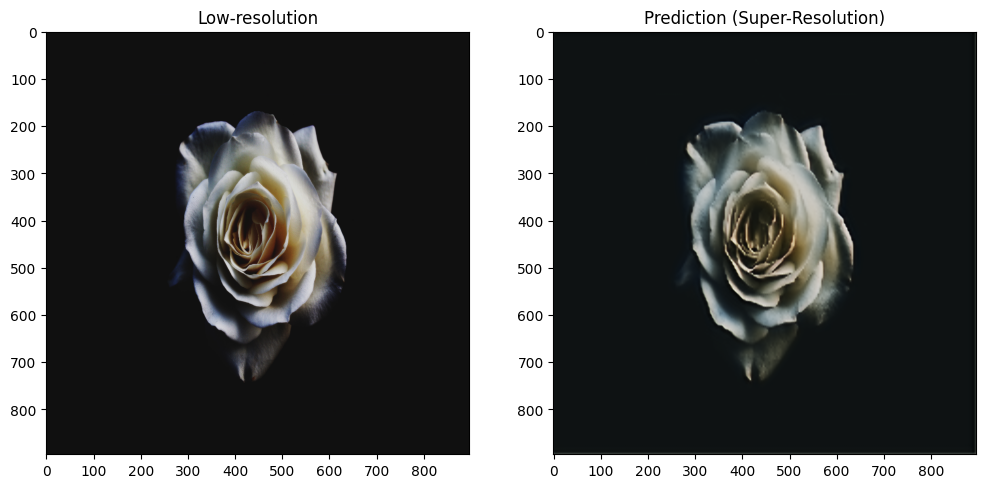

psnr 79.00825502391152
Using win_size: 7
High-res shape: (896, 896, 3)
Preds shape: (896, 896, 3)
ssim 0.9554995
Data saved to /content/drive/My Drive/AMLS2/metrics/quality_2025_04_03_at_161203.txt
Summary saved to /content/drive/My Drive/AMLS2/metrics/quality_summary_2025_04_03_at_161203.txt



Test run complete


In [ ]:
## Initialize hyperparameters
## set up the variables to keep track of the hyperparameter combinations
stop_overfit_cb = ac.StopOverfittingCallback(patience, threshold)     ## initialise overfitting callback
## Create instances of the dataclass from the list
model_choice   = 1      ## base SRResNet
BATCH_SIZE     = item.batch_size
loss_fn        = "ac."+item.loss
##print(ac.HyperParameters.list_parameters(item))

tqdm_callback = ac.TqdmEpochProgress(total_epochs=item.num_epochs)
if model_choice == 1:
  print("SRRESNET_BASE","with",item)
  ## Define the model
  UPSCALE_FACTOR = 4           ## Factor between LR and HR
  train_dataset,val_dataset = ac.load_data(lr_train_folder,hr_train_folder,lr_val_folder,hr_val_folder,BATCH_SIZE,UPSCALE_FACTOR)
  model = ac.srresnet_base(int(item.num_filter),float(item.dropout_rate))
  if item.loss == "ssim_loss":
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=item.learning_rate), ## Use item.learning_rate
                  loss= ac.ssim_loss,                                          ## ssim loss
                  metrics=['acc'])
  else:
    if item.loss == "psnr_loss":
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=item.learning_rate), ## Use item.learning_rate
                    loss= ac.psnr_loss,                                          ## psnr loss
                    metrics=['acc'])
if model_choice == 2:
  print("EDSR","with",item)
  UPSCALE_FACTOR = 4           ## Factor between LR and HR
  train_dataset,val_dataset = ac.load_data(lr_train_folder,hr_train_folder,lr_val_folder,hr_val_folder,BATCH_SIZE,UPSCALE_FACTOR)
  model = ac.edsr(128,64)
  if item.loss == "ssim_loss":
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=item.learning_rate), ## Use item.learning_rate
                  loss= ac.ssim_loss,                                          ## ssim loss
                  metrics=['acc'])
  else:
    if item.loss == "psnr_loss":
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=item.learning_rate), ## Use item.learning_rate
                    loss= ac.psnr_loss,                                          ## psnr loss
                    metrics=['acc'])
if model_choice == 3:
  print("SRRESNET_TUNE","with",item)
  UPSCALE_FACTOR = 2           ## Factor between LR and HR
  train_dataset,val_dataset = ac.load_data(lr_train_folder,hr_train_folder,lr_val_folder,hr_val_folder,BATCH_SIZE,UPSCALE_FACTOR)
  model = ac.srresnet_tune(item)

if model_choice == 4:
  print("SRRESNET_PLUS","with",item)
  UPSCALE_FACTOR = 2           ## Factor between LR and HR
  train_dataset,val_dataset = ac.load_data(lr_train_folder,hr_train_folder,lr_val_folder,hr_val_folder,BATCH_SIZE,UPSCALE_FACTOR)
  model = ac.srresnet_plus(item)

if verbose == 1:
  print(model.summary())
  print(item.num_epochs)
  if IN_COLAB:
      !nvidia-smi

## Redirect the summary output to a string
summary_string = io.StringIO()
model.summary(print_fn=lambda x: summary_string.write(x + "\n"))
summary_content = summary_string.getvalue()
summary_string.close()

steps_per_epoch  = len(train_dataset)  ## Understand dataset already adjusted by batch
validation_steps = len(val_dataset)    ## Also set up validation

if verbose == 1:
    print("steps",steps_per_epoch,"val_steps",validation_steps)

history = model.fit(
    train_dataset,
    epochs                =item.num_epochs,     ## Total number of epochs
    steps_per_epoch       =steps_per_epoch,     ## Number of steps per epoch
    validation_data       =val_dataset,         ## Validation dataset
    validation_steps      =validation_steps,    ## Number of steps
    verbose=1,                                  ## Set to 1 for progress updates
    callbacks=[tqdm_callback]                   ## Bar to show progress during run
)

## Save results
run_list.append(ac.hyper_process(history,summary_content,item))
## output graphs and save metrics files
ac.graph_and_save(history,summary_content,item,filebase)
if test_run == "Y":
  ac.test_model(val_dataset,model,BATCH_SIZE,filebase)
print("\n\n")
## clear out memory and resources for each iteration
del model                                                ## Delete the model
del train_dataset, val_dataset                           ## Delete data variables
K.clear_session()                                        ## Improved session resources cleardown
## end of loop
print("Test run complete")